<a href="https://colab.research.google.com/github/amyDing629/AI-ML-DL/blob/main/A4Q5.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [4]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
from sklearn.cluster import MeanShift
!pip install opencv-python
import cv2
import numpy as np
from sklearn.cluster import estimate_bandwidth # to automatically estimate a good bandwidth for mean shift
from google.colab.patches import cv2_imshow
import matplotlib.pyplot as plt

5.1

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:61: DeprecationWarning: elementwise comparison failed; this will raise an error in the future.


0.5276490856766767


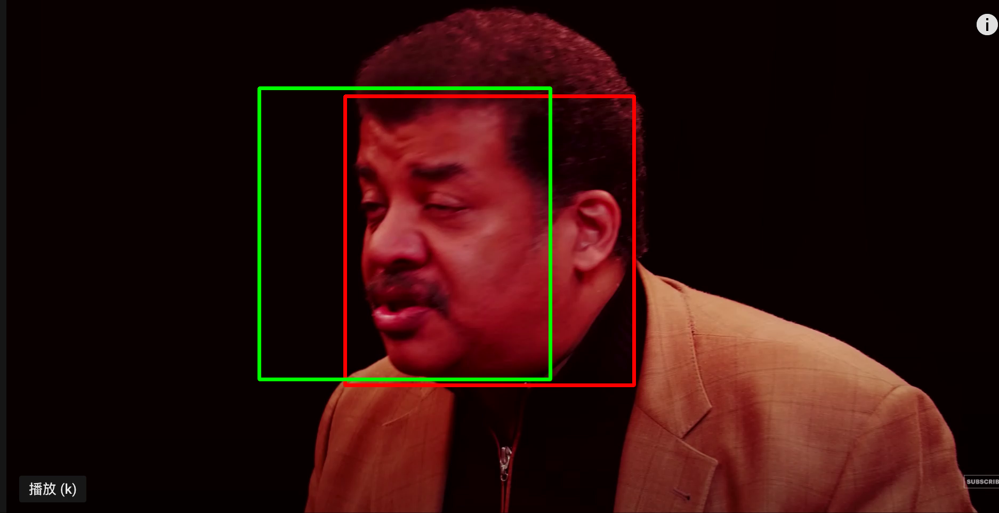

0.48895104335273853


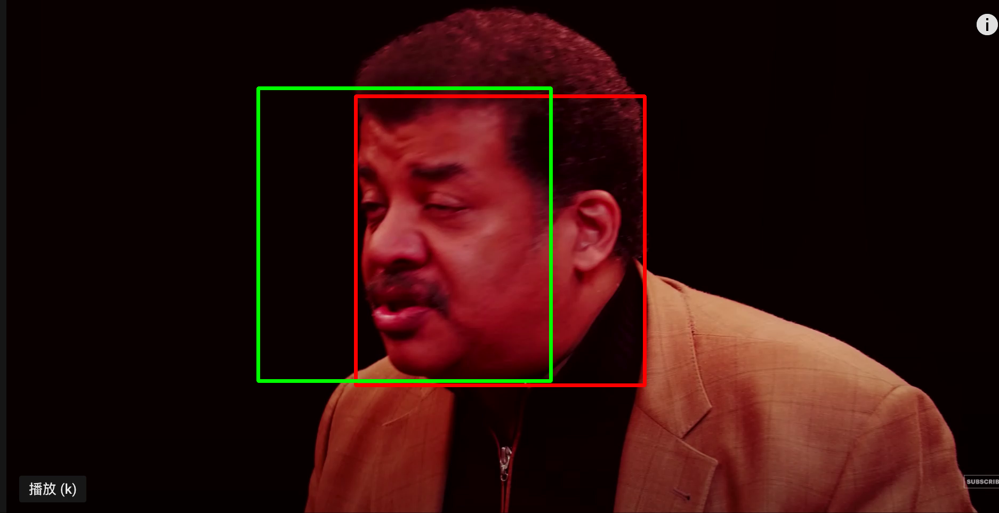

0.48895104335273853


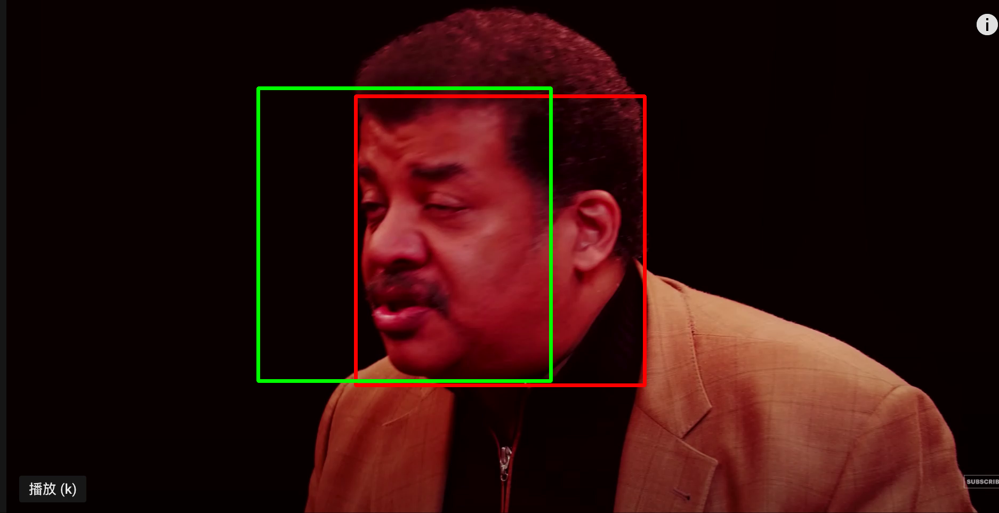

0.48895104335273853


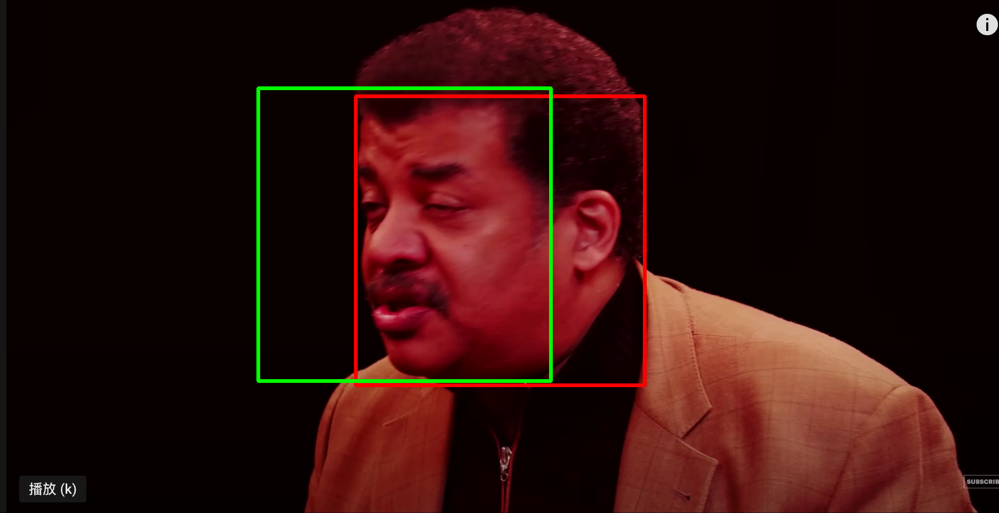

0.4882875234882503


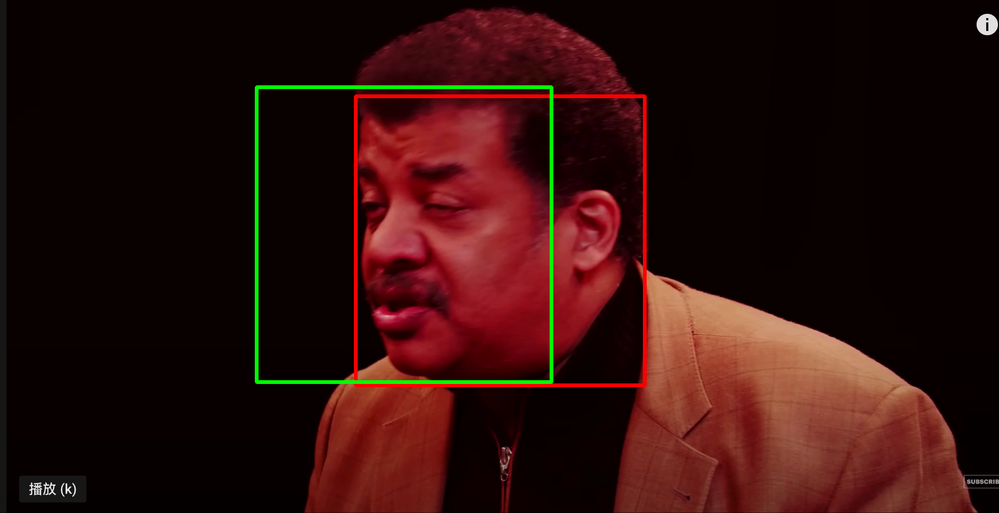

0.49022975532677077


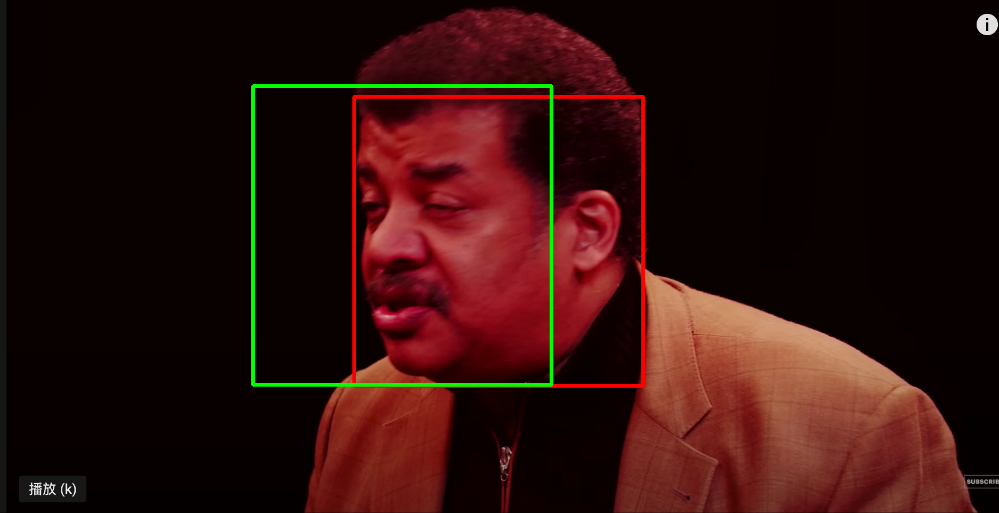

0.48704647905008336


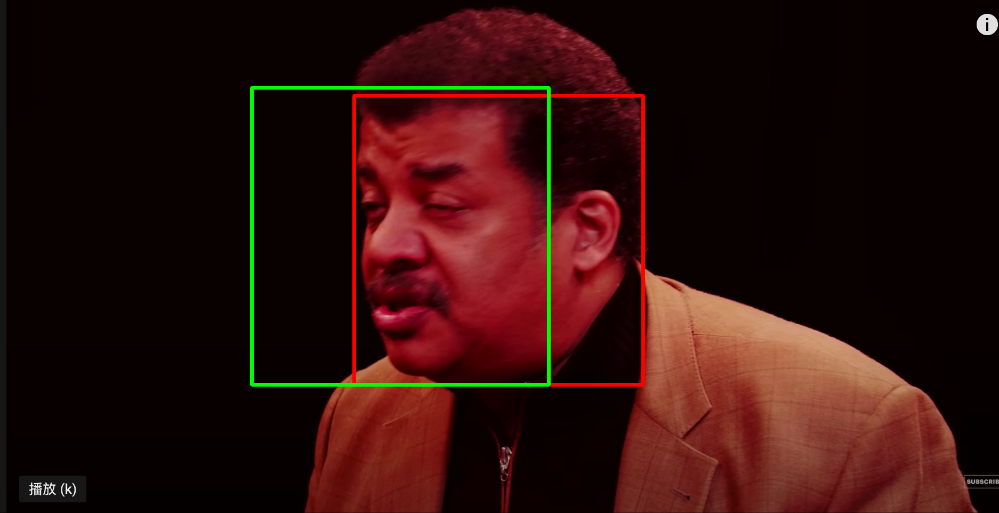

0.5890431521825329


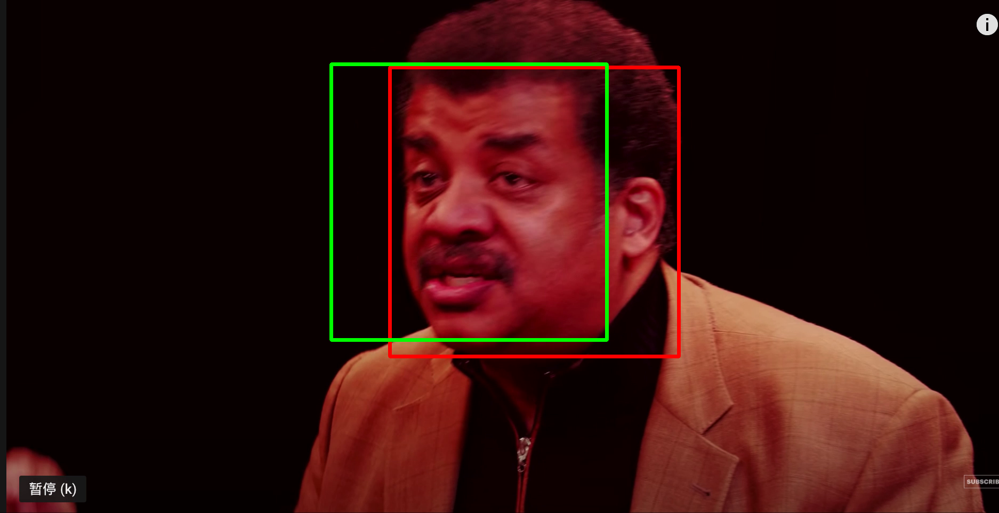

0.5921805807520254


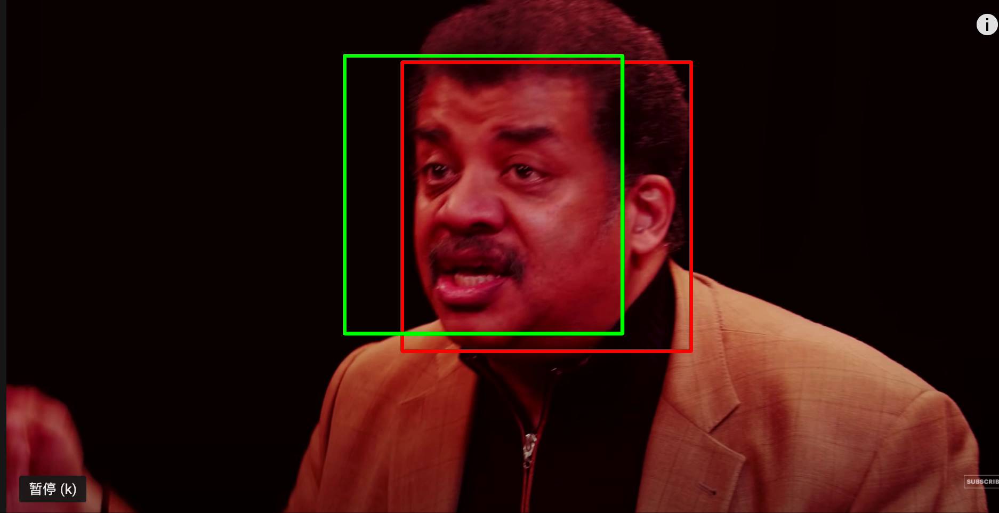

0.6005891566438188


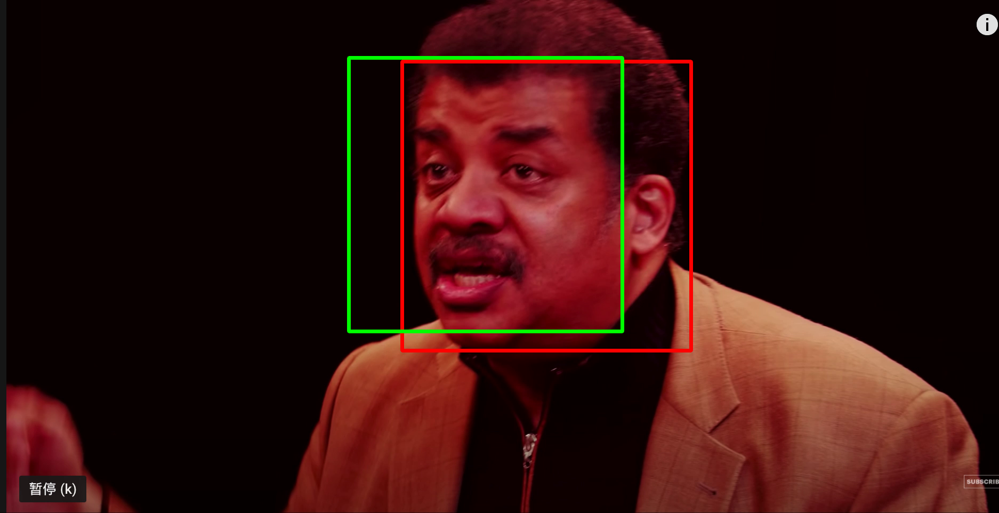

0.5268161494532737


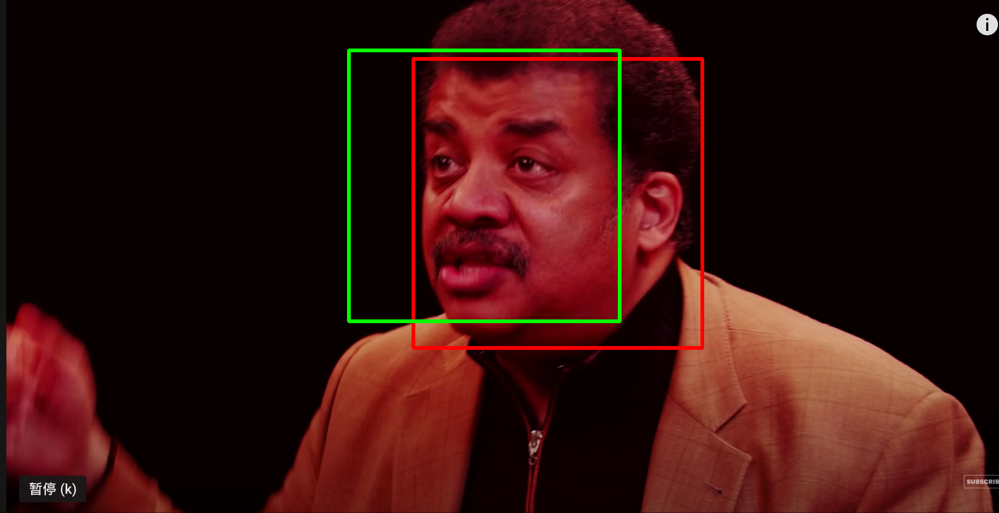

0.4946984532502444


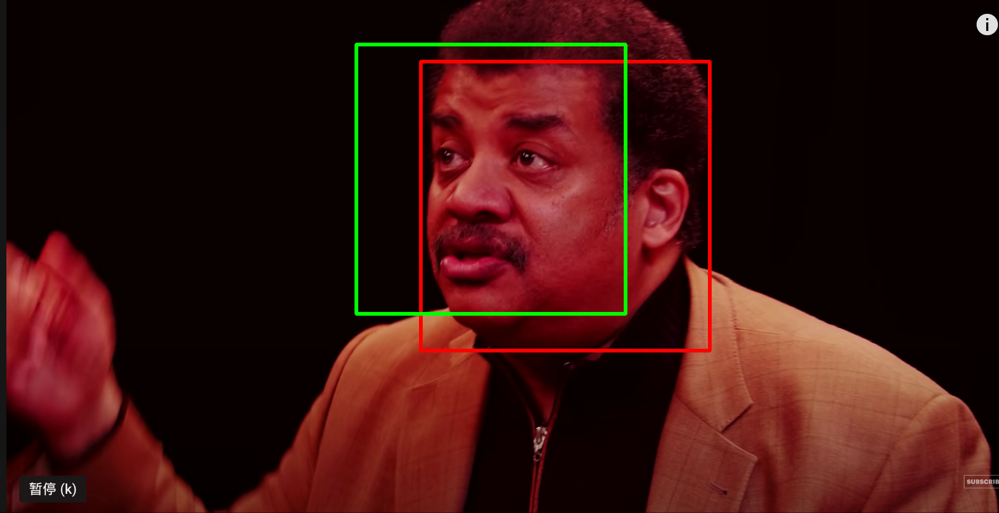

0.48277434322573726


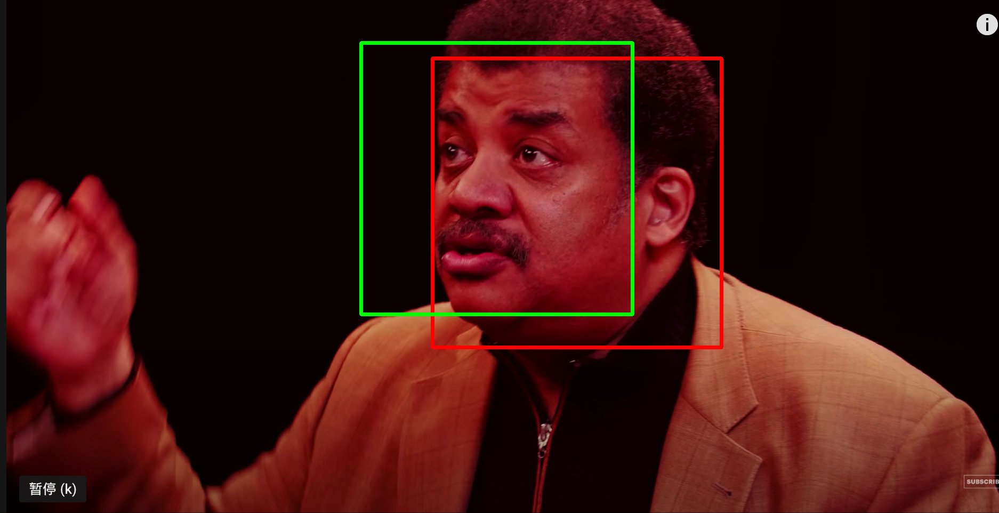

0.46170464482279716


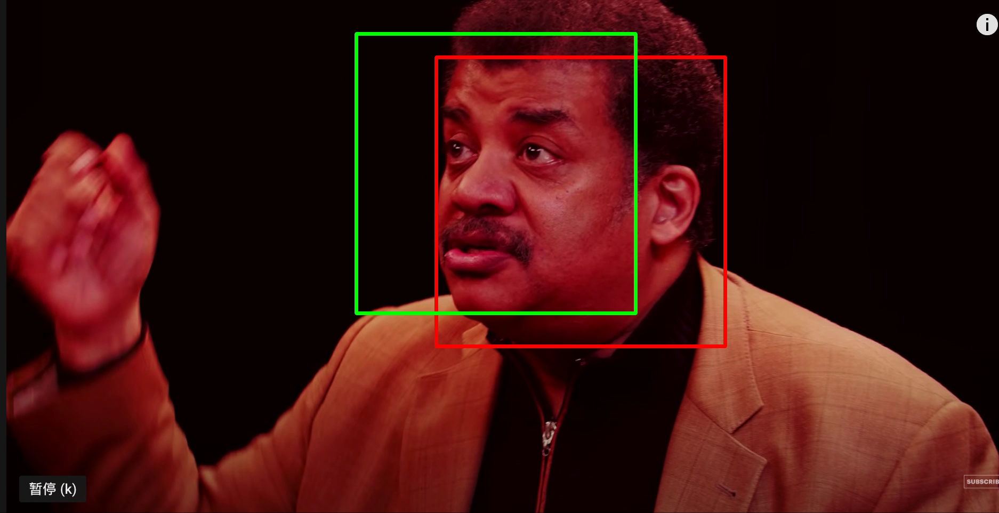

0.4237895634717202


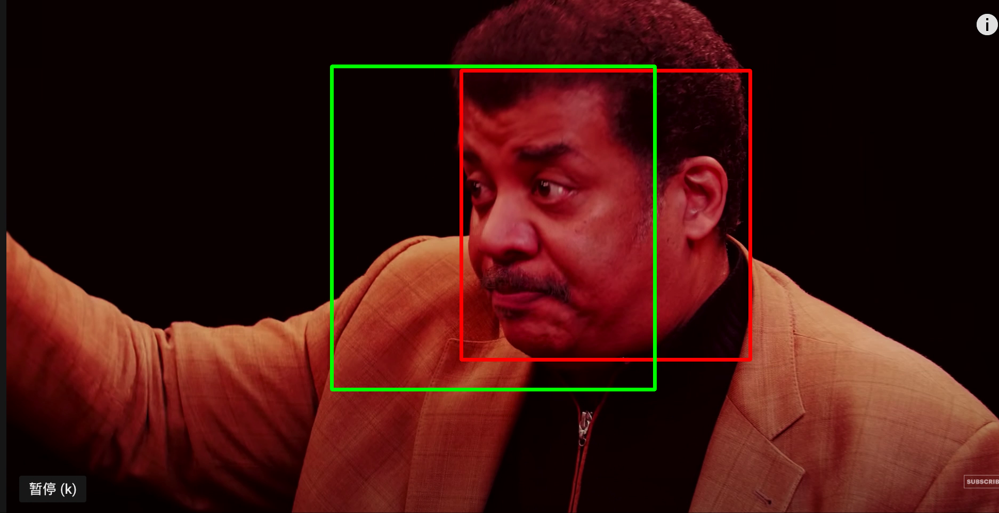

0.4237895634717202


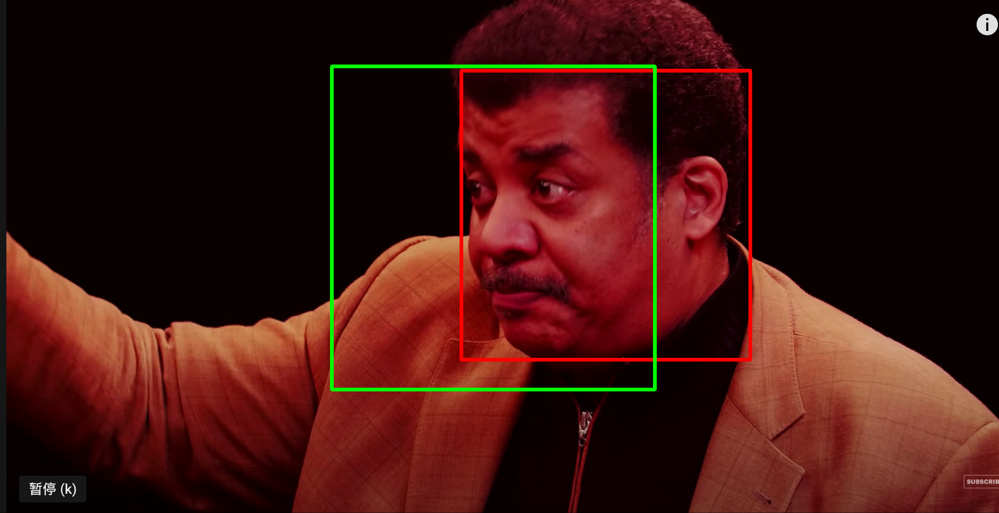

0.4381946166201343


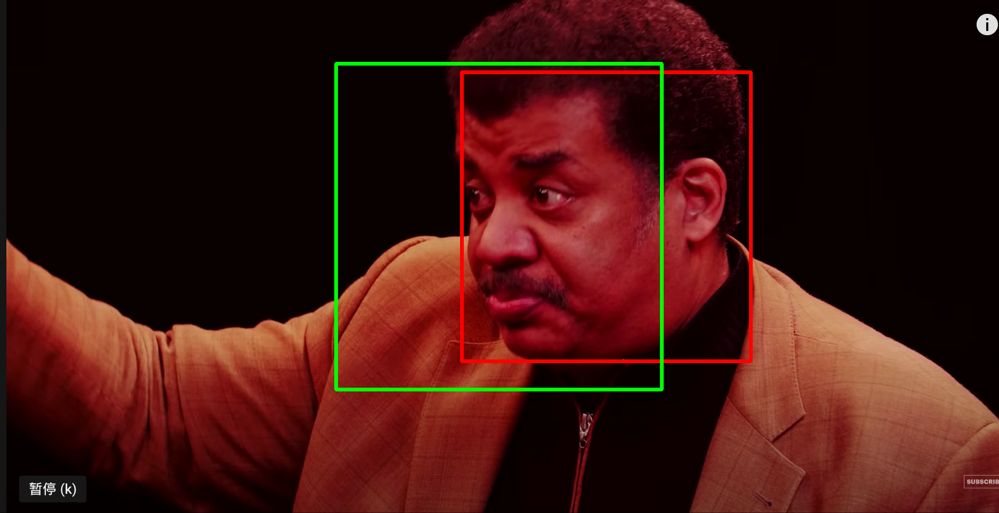

0.4285467857553571


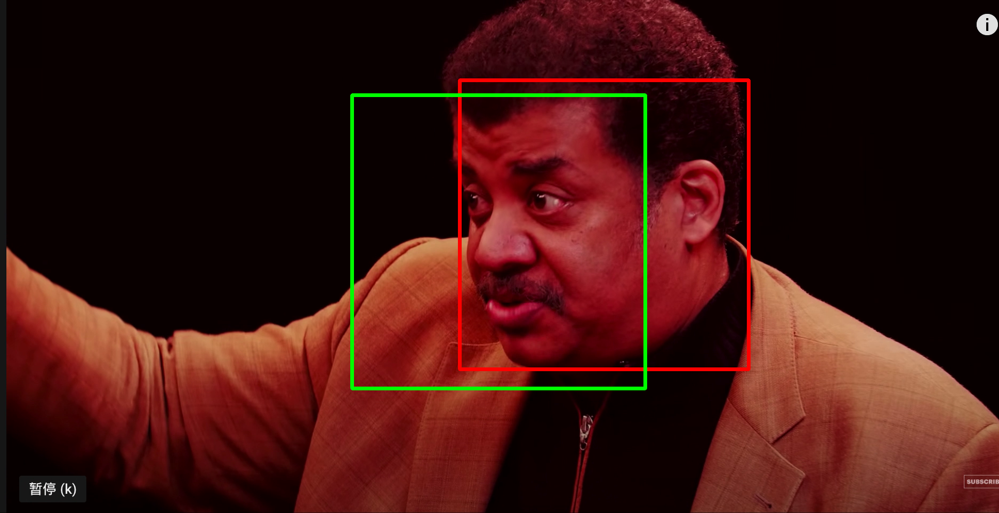

0.4221065087733341


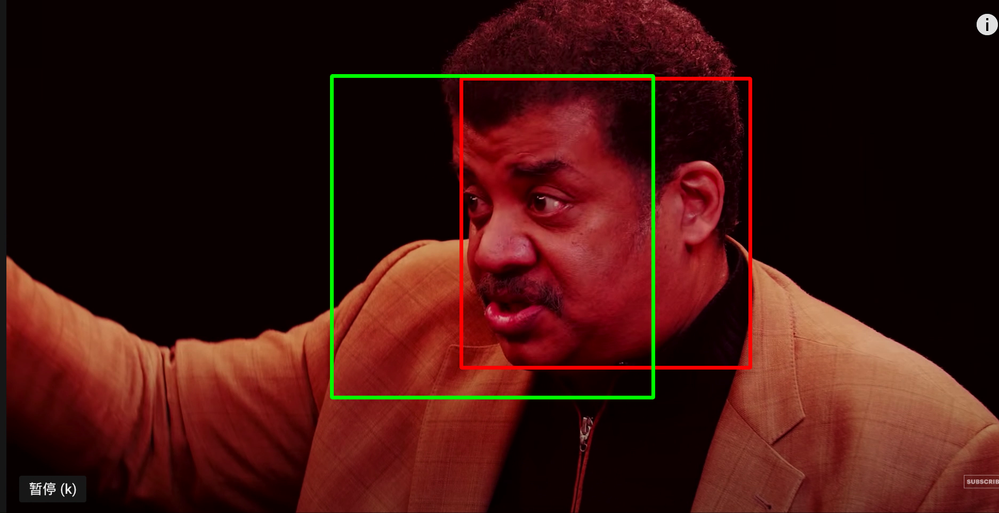

0.46258256043176865


In [ ]:
cap = cv2.VideoCapture('/content/drive/My Drive/video.mov')
# capture one frame
ret,frame = cap.read()

# detect a face on the first frame
face_detector = cv2.CascadeClassifier(cv2.data.haarcascades + 'haarcascade_frontalface_default.xml') 
face_boxes = face_detector.detectMultiScale(frame) 

if len(face_boxes)==0:
    print('no face detected')
    assert(False)

# initialize the tracing window around the (first) detected face
(x,y,w,h) = tuple(face_boxes[0]) 
track_window = (x,y,w,h)

#  region of interest for tracking
roi = frame[y:y+h, x:x+w]

# convert the roi to HSV so we can construct a histogram of Hue 
hsv_roi =  cv2.cvtColor(roi, cv2.COLOR_BGR2HSV)

# why do we need this mask? (remember the cone?)
# read the description for Figure 3 in the original Cam Shift paper: http://citeseerx.ist.psu.edu/viewdoc/summary?doi=10.1.1.14.7673 
mask = cv2.inRange(hsv_roi, np.array((0., 60.,32.)), np.array((180.,255.,255.)))


# form histogram of hue in the roi
roi_hist = cv2.calcHist([hsv_roi],[0],mask,[180],[0,180])

# normalize the histogram array values so they are in the min=0 to max=255 range
cv2.normalize(roi_hist,roi_hist,0,255,cv2.NORM_MINMAX)

# termination criteria for mean shift: 10 iteration or shift less than 1 pixel
term_crit = ( cv2.TERM_CRITERIA_EPS | cv2.TERM_CRITERIA_COUNT, 10, 1 )
IoU_list = [] 
frame_number_list = []
frame_number = 2
larger_than_50 = 0
while True:
    
    # grab a frame
    ret ,frame = cap.read()
    
    if ret == True: 
  
        # convert to HSV
        hsv = cv2.cvtColor(frame, cv2.COLOR_BGR2HSV)
        
        # histogram back projection using roi_hist 
        dst = cv2.calcBackProject([hsv],[0],roi_hist,[0,180],1)

        # use meanshift to shift the tracking window
        ret, track_window = cv2.meanShift(dst, track_window, term_crit)
        
        # display tracked window
        x,y,w,h = track_window
        img = cv2.rectangle(frame, (x,y), (x+w,y+h), (0,0,255),5)

        face_boxes = face_detector.detectMultiScale(frame)
        if face_boxes == ():
          continue
        inter_width = max(0, (min(face_boxes[0][0] + face_boxes[0][2], track_window[0] + track_window[2]) - max(face_boxes[0][0], track_window[0])))
        inter_length = max(0, (min(face_boxes[0][1] + face_boxes[0][3], track_window[1] + track_window[3]) - max(face_boxes[0][1], track_window[1])))
        intersection_area = inter_width * inter_length
        union_area = (face_boxes[0][2] * face_boxes[0][3]) + track_window[2] * track_window[3] - intersection_area
        IoU = intersection_area/union_area
        frame_number_list.append(frame_number)
        frame_number += 1
        IoU_list.append(IoU)
        print(IoU)
        if IoU > 0.5:
          larger_than_50 += 1
        x2,y2,w2,h2 = face_boxes[0]
        img = cv2.rectangle(frame, (x2,y2), (x2+w2,y2+h2), (0,255,0),5)
        cv2_imshow(img)
        
        if cv2.waitKey(33) & 0xFF == 27: # wait a bit and exit is ESC is pressed
            break  
    else:
        break
print(larger_than_50/(frame_number - 2))
        
cv2.destroyAllWindows()
cap.release()


In [ ]:
frame_number_array = np.array(frame_number_list)
IoU_array = np.array(IoU_list)
plt.plot(frame_number_array, IoU_array)
plt.show()

5.2

In [ ]:
cap = cv2.VideoCapture('/content/drive/My Drive/video.mov')

# capture one frame
ret,frame = cap.read()

# detect a face on the first frame
face_detector = cv2.CascadeClassifier(cv2.data.haarcascades + 'haarcascade_frontalface_default.xml') 
face_boxes = face_detector.detectMultiScale(frame) 

if len(face_boxes)==0:
    print('no face detected')
    assert(False)

# initialize the tracing window around the (first) detected face
(x,y,w,h) = tuple(face_boxes[0]) 
track_window = (x,y,w,h)

#  region of interest for tracking
roi = frame[y:y+h, x:x+w]

gray_roi = cv2.cvtColor(roi, cv2.COLOR_BGR2GRAY)
img = cv2.GaussianBlur(gray_roi,(3,3),0)
sobelx = cv2.Sobel(img,cv2.CV_64F,1,0,ksize=5)  # x
sobely = cv2.Sobel(img,cv2.CV_64F,0,1,ksize=5)  # y
mag, ang = cv2.cartToPolar(sobelx, sobely, angleInDegrees=True)
max_mag = np.amax(mag)
mask = np.zeros((mag.shape[0],mag.shape[1]), dtype="uint8")
for i in range(mag.shape[0]):
  for j in range(mag.shape[1]):
    if mag[i][j] > 0.1 * max_mag:
       mask[i][j] = gray_roi[i][j]
# form histogram of hue in the roi
roi_hist = cv2.calcHist([gray_roi],[0],mask,[180],[0,180])

# normalize the histogram array values so they are in the min=0 to max=255 range
cv2.normalize(roi_hist,roi_hist,0,255,cv2.NORM_MINMAX)

# termination criteria for mean shift: 10 iteration or shift less than 1 pixel
term_crit = ( cv2.TERM_CRITERIA_EPS | cv2.TERM_CRITERIA_COUNT, 10, 1 )

frame_number = 2
frame_number_list = []
IoU_list = []
larger_than_50_percent = 0
while True:
    
    # grab a frame
    ret ,frame = cap.read() 
    if ret == True: 
        face_boxes = face_detector.detectMultiScale(frame)
        if face_boxes == ():
          continue
        (xf,yf,wf,hf) = tuple(face_boxes[0])
        roi = frame[yf:yf+hf, xf:xf+wf]
        gray_roi = cv2.cvtColor(roi, cv2.COLOR_BGR2GRAY)
        img = cv2.GaussianBlur(gray_roi,(3,3),0)
        sobelx = cv2.Sobel(img,cv2.CV_64F,1,0,ksize=5)  # x
        sobely = cv2.Sobel(img,cv2.CV_64F,0,1,ksize=5)  # y
        mag, ang = cv2.cartToPolar(sobelx, sobely, angleInDegrees=True)
        max_mag = np.amax(mag)
        mask = np.zeros((mag.shape[0],mag.shape[1]), dtype="uint8")
        for i in range(mag.shape[0]):
          for j in range(mag.shape[1]):
            if mag[i][j] > 0.05 * max_mag:
              mask[i][j] = gray_roi[i][j]

        # form histogram of hue in the roi
        roi_hist = cv2.calcHist([gray_roi],[0],mask,[180],[0,180])

        gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
  
        # histogram back projection using roi_hist 
        dst = cv2.calcBackProject([gray],[0],roi_hist,[0,180],1)
        
        # use meanshift to shift the tracking window
        ret, track_window = cv2.meanShift(dst, track_window, term_crit)
        face_boxes = face_detector.detectMultiScale(frame)
        inter_width = max(0, (min(face_boxes[0][0] + face_boxes[0][2], track_window[0] + track_window[2]) - max(face_boxes[0][0], track_window[0])))
        inter_length = max(0, (min(face_boxes[0][1] + face_boxes[0][3], track_window[1] + track_window[3]) - max(face_boxes[0][1], track_window[1])))
        intersection_area = inter_width * inter_length
        union_area = (face_boxes[0][2] * face_boxes[0][3]) + track_window[2] * track_window[3] - intersection_area
        IoU = intersection_area/union_area
        if IoU > 0.5:
          larger_than_50_percent += 1
        frame_number_list.append(frame_number)
        IoU_list.append(IoU)
        print(IoU)
        # display tracked window
        x,y,w,h = track_window
        img = cv2.rectangle(frame, (x,y), (x+w,y+h), (0,0,255),5)
        x2,y2,w2,h2 = face_boxes[0]
        img = cv2.rectangle(frame, (x2,y2), (x2+w2,y2+h2), (0,255,0),5)
        cv2_imshow(img)
        frame_number += 1
    else:
        break
print(larger_than_50_percent/(frame_number-2))        
cv2.destroyAllWindows()
cap.release()

In [ ]:
frame_number_array = np.array(frame_number_list)
IoU_array = np.array(IoU_list)
plt.plot(frame_number_array, IoU_array)
plt.show()